# Indian Landmark Detection Using VGG-19

# Importing libraries

In [1]:
import os
import cv2
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import keras
import tensorflow

from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import VGG19
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout, BatchNormalization, Activation

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, precision_score, f1_score 

# Defining data paths

In [2]:
train_path = r'archive - Copy\Indian-monuments\images\train'
test_path = r'archive - Copy\Indian-monuments\images\test'

# Converting image to pixels

Ajanta Caves


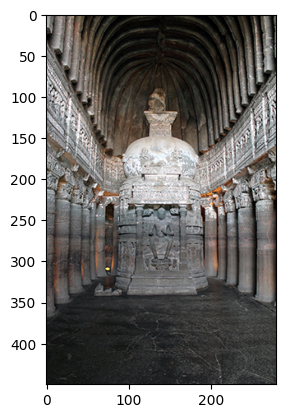

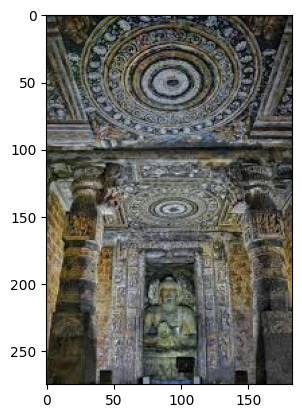

alai_darwaza


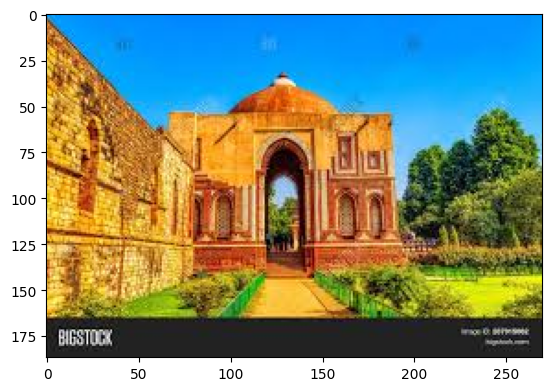

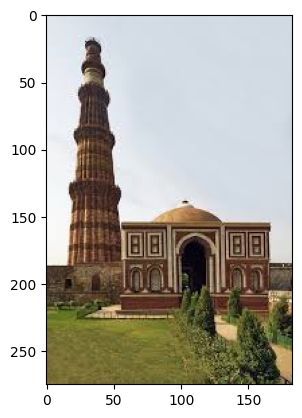

alai_minar


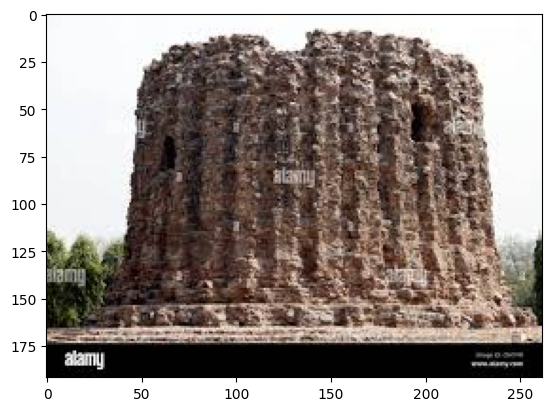

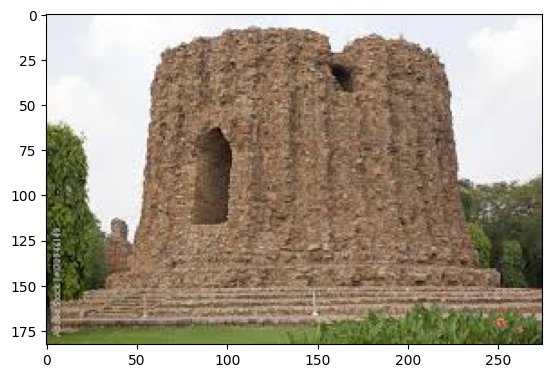

basilica_of_bom_jesus


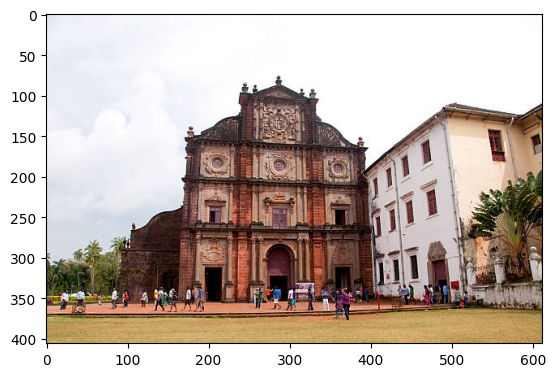

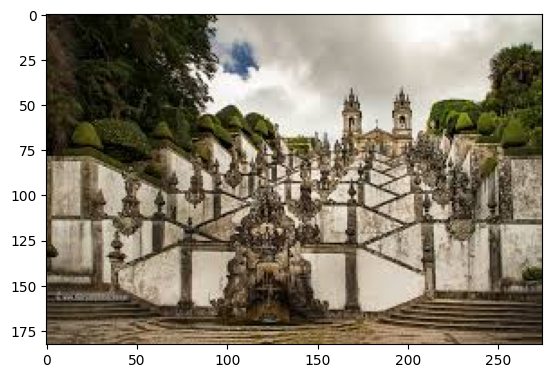

Charar-E- Sharif


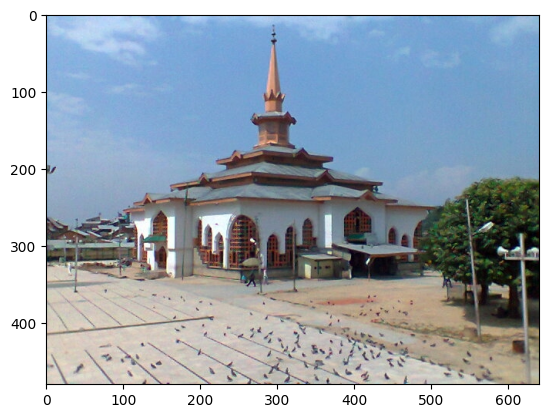

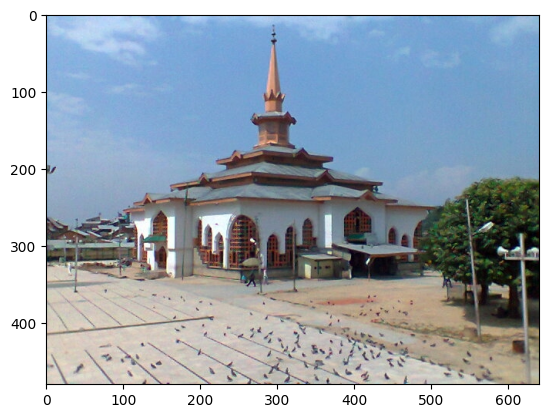

charminar


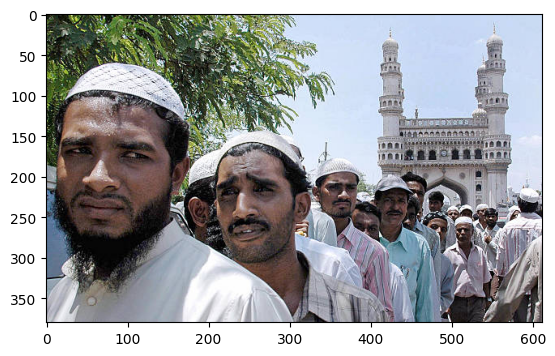

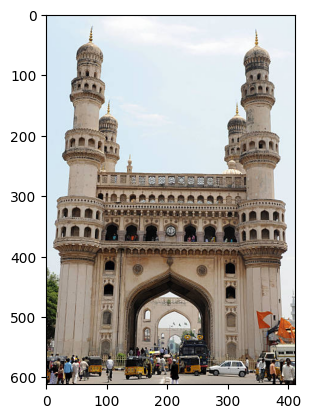

Chhota_Imambara


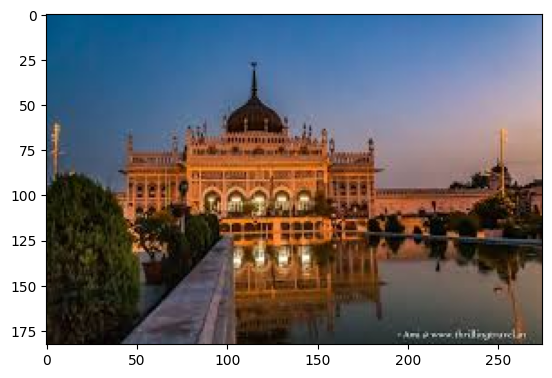

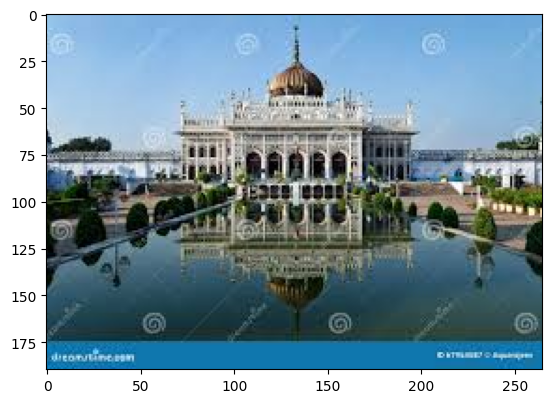

Ellora Caves


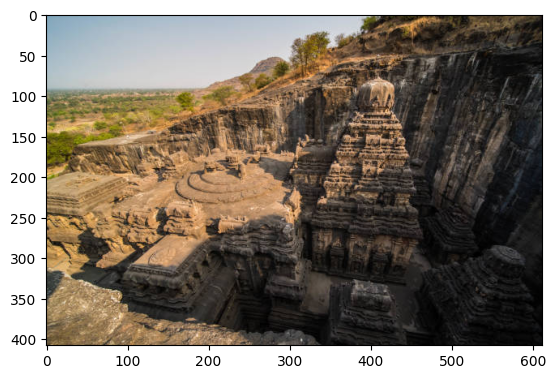

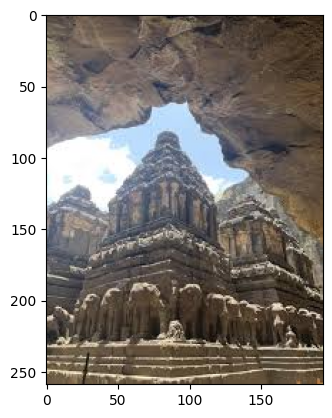

Fatehpur Sikri


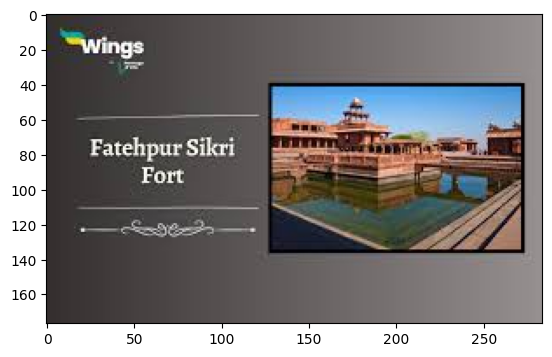

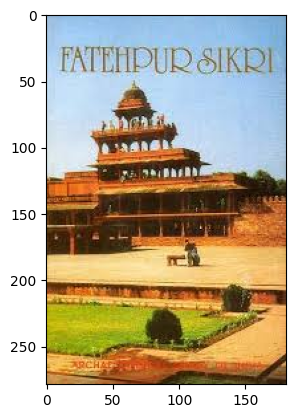

Gateway of India


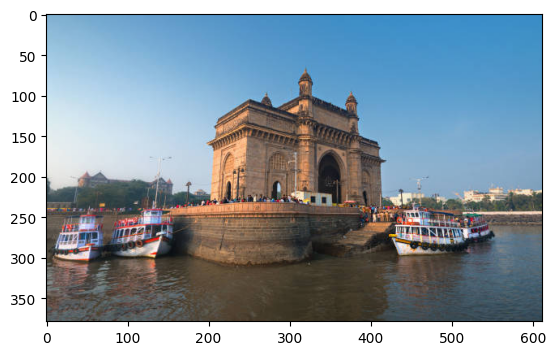

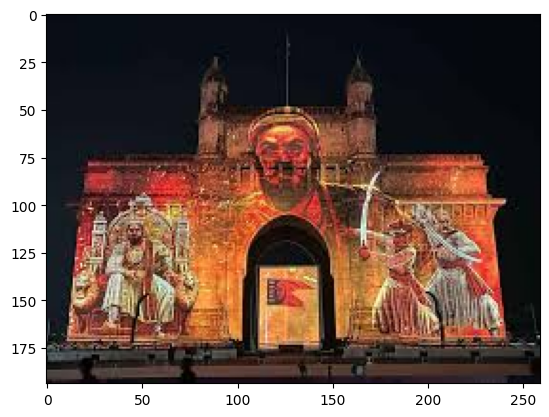

golden temple


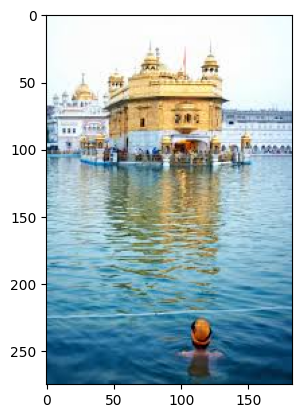

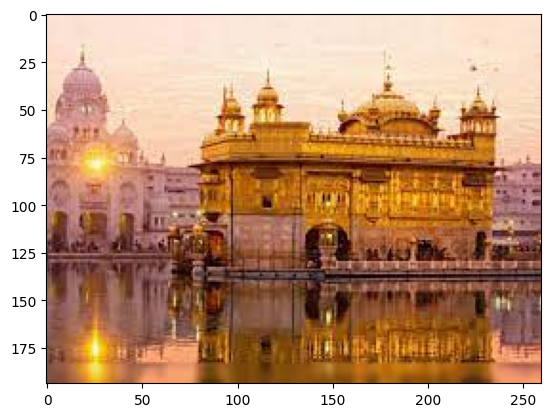

hawa mahal pics


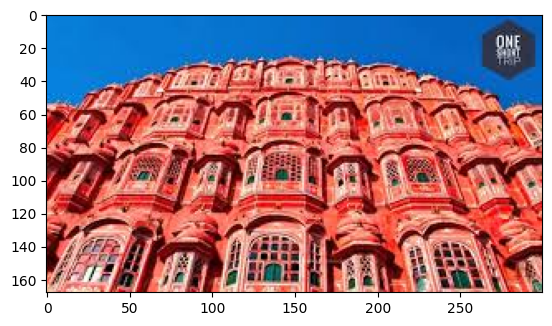

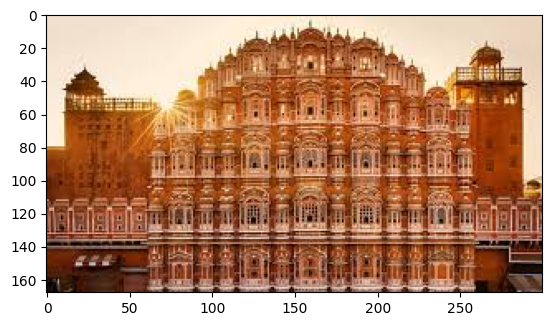

Humayun_s Tomb


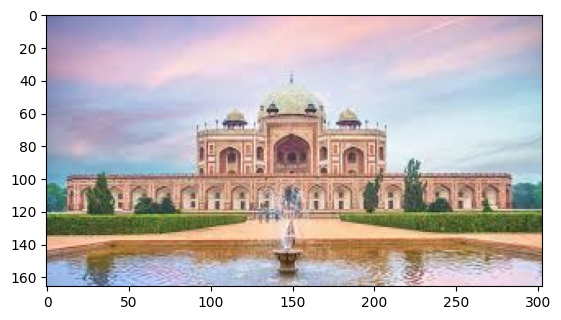

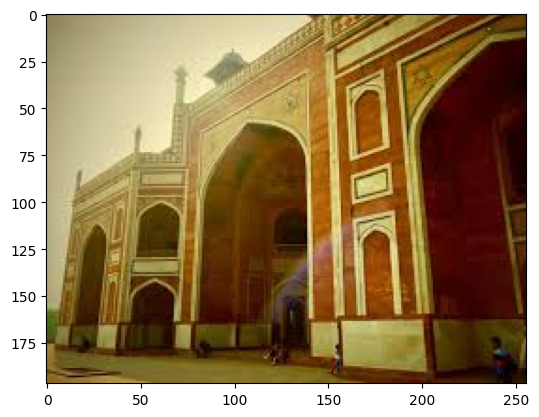

India gate pics


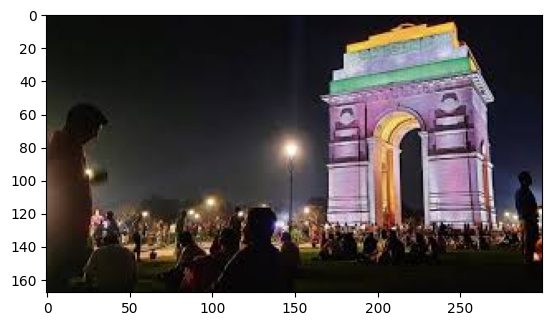

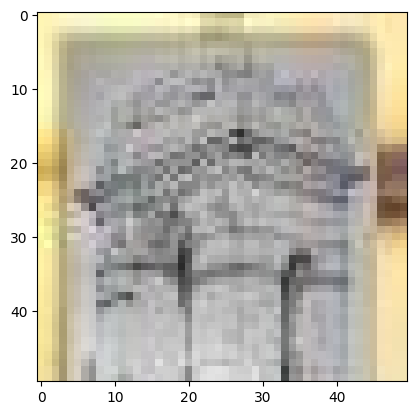

iron_pillar


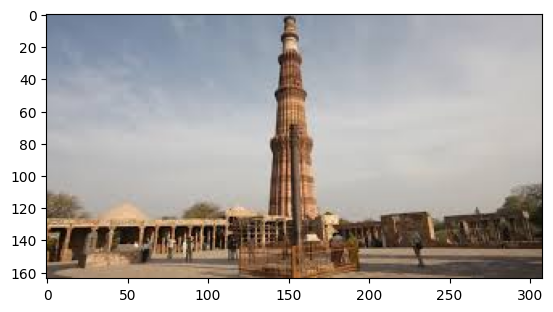

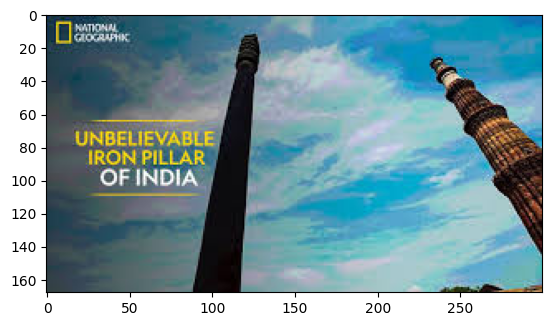

jamali_kamali_tomb


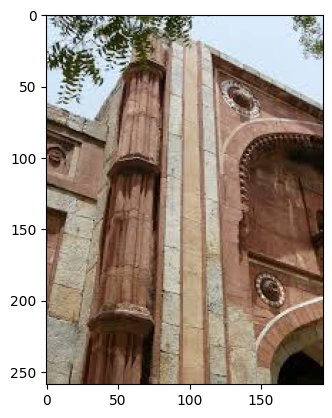

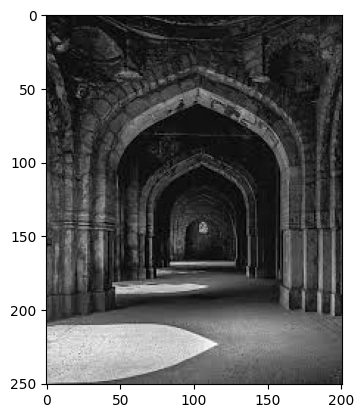

Khajuraho


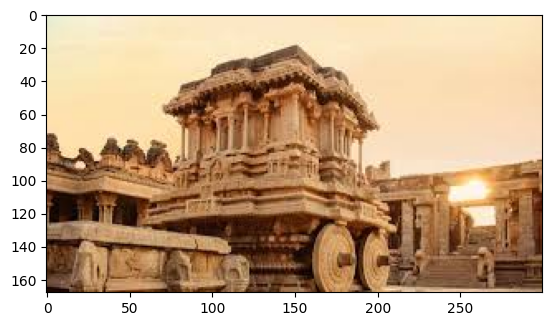

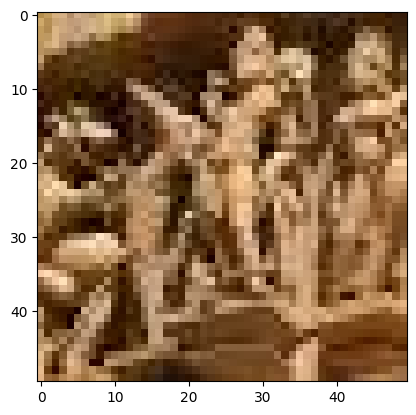

lotus_temple


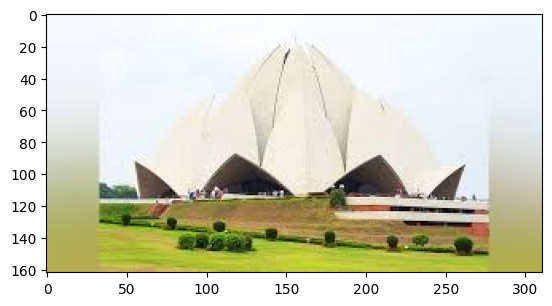

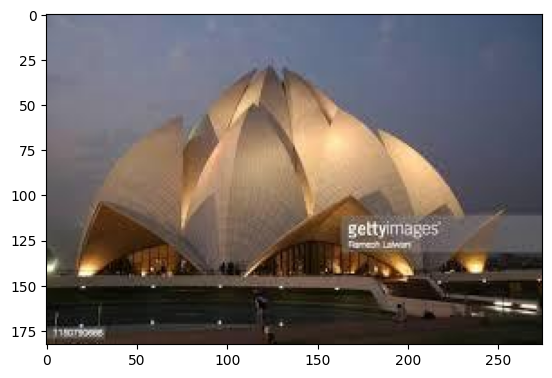

mysore_palace


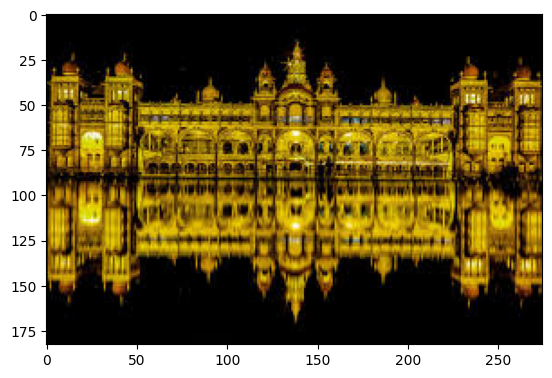

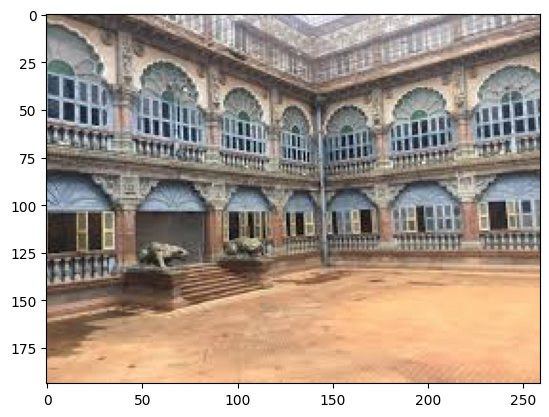

qutub_minar


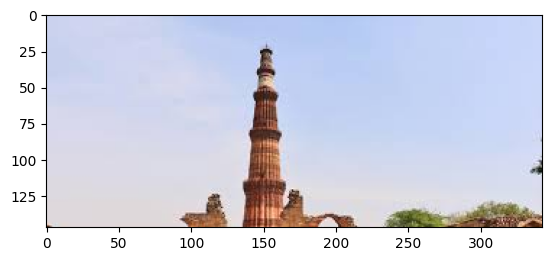

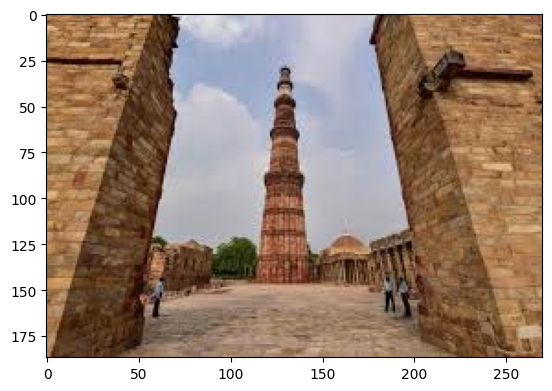

Sun Temple Konark


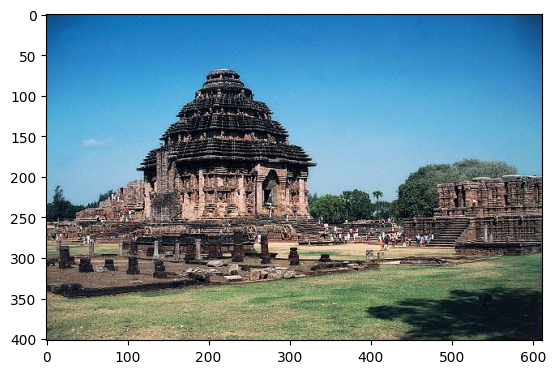

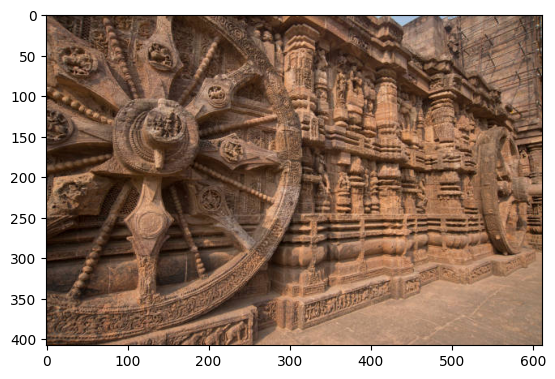

tajmahal


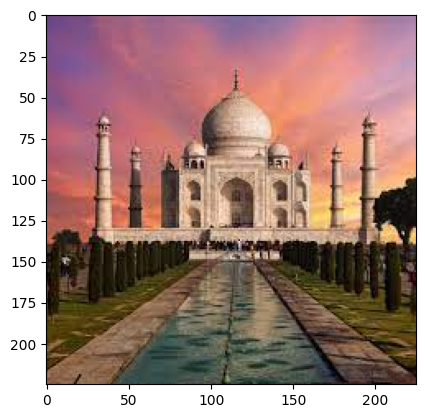

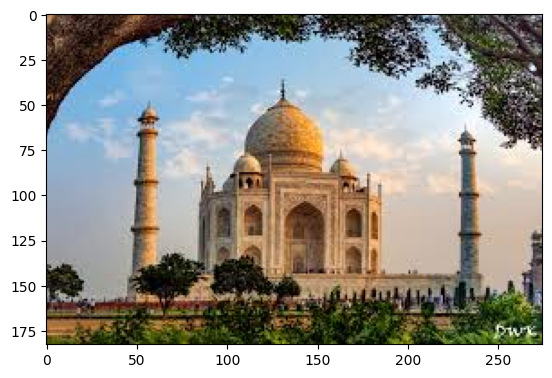

tanjavur temple


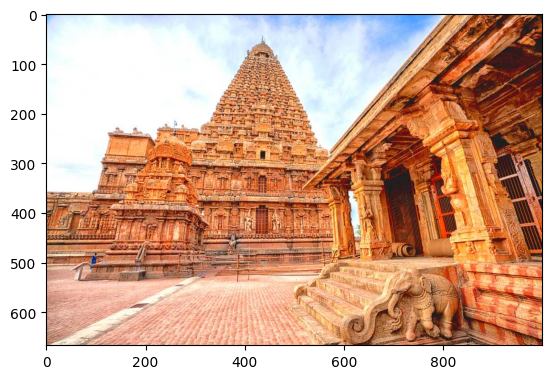

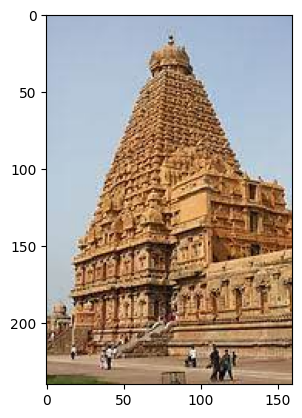

victoria memorial


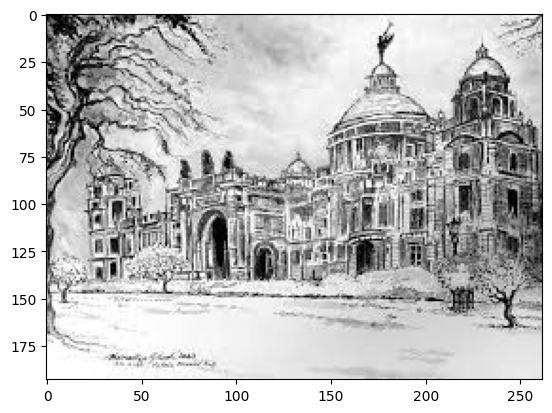

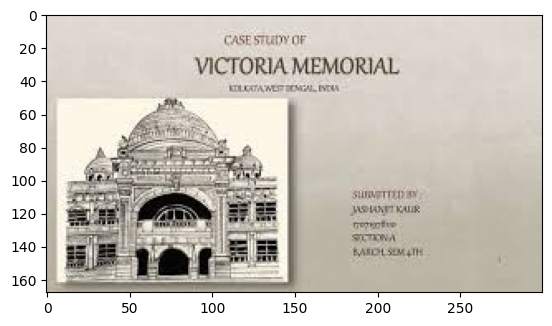

In [3]:
for folder in os.listdir(train_path):
    sub_path = train_path + "/" + folder
    
    print(folder)
    for i in range(2):
        temp_path = os.listdir(sub_path)[i]
        temp_path = sub_path + "/" + temp_path
        img = mpimg.imread(temp_path)
        imgplot = plt.imshow(img)
        plt.show()

In [3]:
def imagearray(path, size):
    data = []
    for folder in os.listdir(path):
        sub_path=path+"/"+folder

        for img in os.listdir(sub_path):
            image_path=sub_path+"/"+img
            img_arr=cv2.imread(image_path)
            img_arr=cv2.resize(img_arr,size)
            
            data.append(img_arr)

    return data

In [4]:
size = (250,250)
train = imagearray(train_path, size)


In [5]:
test = imagearray(test_path, size)

# Normalization

In [9]:
x_train = np.array(train)
x_test = np.array(test)

x_train.shape,x_test.shape

((7909, 250, 250, 3), (1045, 250, 250, 3))

In [10]:
x_train = x_train/255.0
x_test = x_test/255.0


# Defining target variables

In [11]:
def data_class(data_path, size, class_mode):
    datagen = ImageDataGenerator(rescale = 1./255)
    classes = datagen.flow_from_directory(data_path,
                                          target_size = size,
                                          batch_size = 32,
                                          class_mode = class_mode)
    return classes

In [12]:
train_class = data_class(train_path, size, 'sparse')
test_class = data_class(test_path, size, 'sparse')

Found 7909 images belonging to 24 classes.
Found 1045 images belonging to 24 classes.


In [13]:
y_train = train_class.classes
y_test = test_class.classes
print(train_class)

In [14]:
train_class.class_indices

{'Ajanta Caves': 0,
 'Charar-E- Sharif': 1,
 'Chhota_Imambara': 2,
 'Ellora Caves': 3,
 'Fatehpur Sikri': 4,
 'Gateway of India': 5,
 'Humayun_s Tomb': 6,
 'India gate pics': 7,
 'Khajuraho': 8,
 'Sun Temple Konark': 9,
 'alai_darwaza': 10,
 'alai_minar': 11,
 'basilica_of_bom_jesus': 12,
 'charminar': 13,
 'golden temple': 14,
 'hawa mahal pics': 15,
 'iron_pillar': 16,
 'jamali_kamali_tomb': 17,
 'lotus_temple': 18,
 'mysore_palace': 19,
 'qutub_minar': 20,
 'tajmahal': 21,
 'tanjavur temple': 22,
 'victoria memorial': 23}

In [15]:
y_train.shape,y_test.shape,x_train.shape,x_test.shape
# y_val.shape

((7909,), (1045,), (7909, 250, 250, 3), (1045, 250, 250, 3))

# VGG19 Model

In [16]:
vgg = VGG19(input_shape = (250, 250, 3), weights = 'imagenet', include_top = False)

In [17]:
for layer in vgg.layers:
    layer.trainable = False

x = Flatten()(vgg.output)
prediction = Dense(24, activation='softmax')(x)

model = Model(inputs=vgg.input, outputs=prediction)
model.summary()
model.compile(
  loss='sparse_categorical_crossentropy',
  optimizer="adam",
  metrics=['accuracy']
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 250, 250, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 250, 250, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 250, 250, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 125, 125, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 125, 125, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 125, 125, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 62, 62, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 62, 62, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 62, 62, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 62, 62, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 62, 62, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 31, 31, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 31, 31, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 31, 31, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 31, 31, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 31, 31, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 15, 15, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 15, 15, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 15, 15, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 15, 15, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 15, 15, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 24)             │       602,136 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,626,520 (78.68 MB)

 Trainable params: 602,136 (2.30 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [19]:
early_stop = EarlyStopping(monitor = 'val_loss', mode='min', verbose = 1, patience = 5)

In [20]:
history = model.fit(x_train,y_train, validation_data = (x_test,y_test), epochs = 10, callbacks=[early_stop], batch_size = 30,
                    shuffle=True)

Epoch 1/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 3084s 11s/step - accuracy: 0.3604 - loss: 2.6060 - val_accuracy: 0.5254 - val_loss: 2.5025
Epoch 2/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2544s 10s/step - accuracy: 0.7235 - loss: 0.9685 - val_accuracy: 0.5943 - val_loss: 2.2280
Epoch 3/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2553s 10s/step - accuracy: 0.8286 - loss: 0.5631 - val_accuracy: 0.5780 - val_loss: 2.4538
Epoch 4/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2537s 10s/step - accuracy: 0.8853 - loss: 0.4026 - val_accuracy: 0.5952 - val_loss: 2.7145
Epoch 5/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2543s 10s/step - accuracy: 0.8982 - loss: 0.3809 - val_accuracy: 0.6220 - val_loss: 3.0336
Epoch 6/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2566s 10s/step - accuracy: 0.9137 - loss: 0.3285 - val_accuracy: 0.5990 - val_loss: 3.0443
Epoch 7/10
264/264 ━━━━━━━━━━━━━━━━━━━━ 2530s 10s/step - accuracy: 0.9101 - loss: 0.3349 - val_accuracy: 0.5809 - val_loss: 3.7339
Epoch 7: early stopping


In [22]:
model.save("Classification_model_vgg19(2).h5")


# Visualization

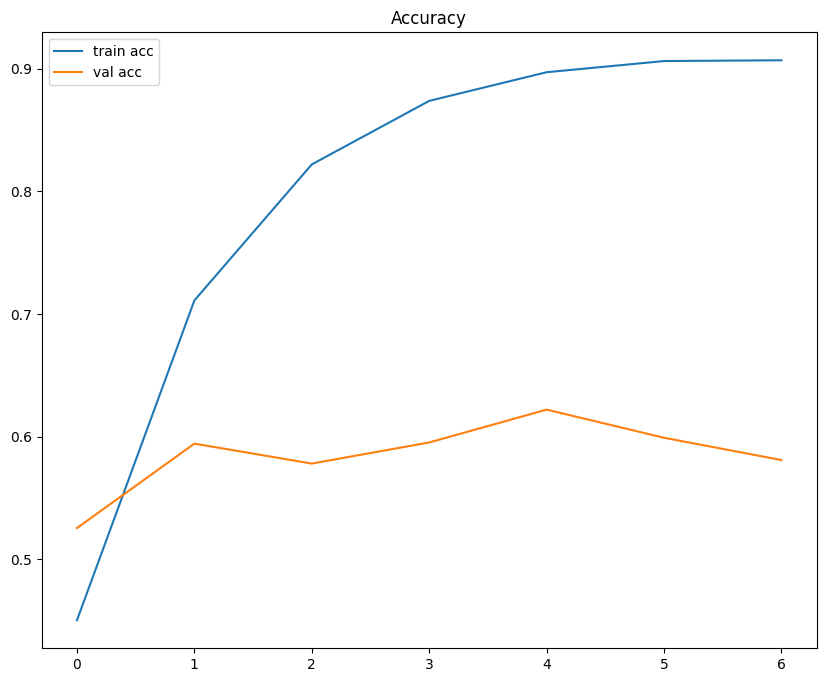

In [24]:
plt.figure(figsize=(10, 8))
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()
plt.title('Accuracy')
plt.show()

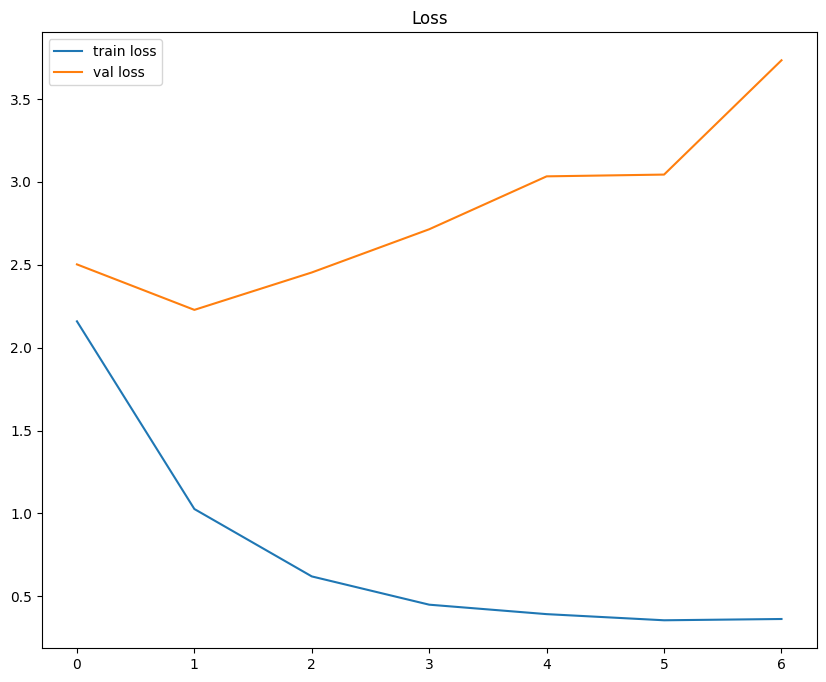

In [25]:
plt.figure(figsize=(10, 8))
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.title('Loss')
plt.show()

# Model Evaluation

In [26]:
model.evaluate(x_test, y_test, batch_size=32)

33/33 ━━━━━━━━━━━━━━━━━━━━ 315s 9s/step - accuracy: 0.5528 - loss: 4.5700


[3.712730646133423, 0.5808612704277039]

In [27]:
y_pred = model.predict(x_test)

33/33 ━━━━━━━━━━━━━━━━━━━━ 313s 9s/step


In [28]:
y_pred=np.argmax(y_pred,axis=1)

In [29]:
print(classification_report(y_pred,y_test))


              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       0.85      0.83      0.84        35
           2       0.47      0.25      0.33        28
           3       0.21      0.33      0.25        21
           4       0.52      0.69      0.59        32
           5       0.37      0.42      0.39        26
           6       0.33      0.93      0.49        29
           7       1.00      0.36      0.53        83
           8       0.47      1.00      0.64        21
           9       0.00      0.00      0.00         8
          10       0.10      0.13      0.11        31
          11       0.81      0.30      0.44        97
          12       0.17      0.67      0.27         9
          13       0.90      0.45      0.60        60
          14       0.78      0.48      0.59        67
          15       0.37      0.56      0.44        43
          16       0.81      0.91      0.86        89
          17       0.59    

# Confusion Matrix

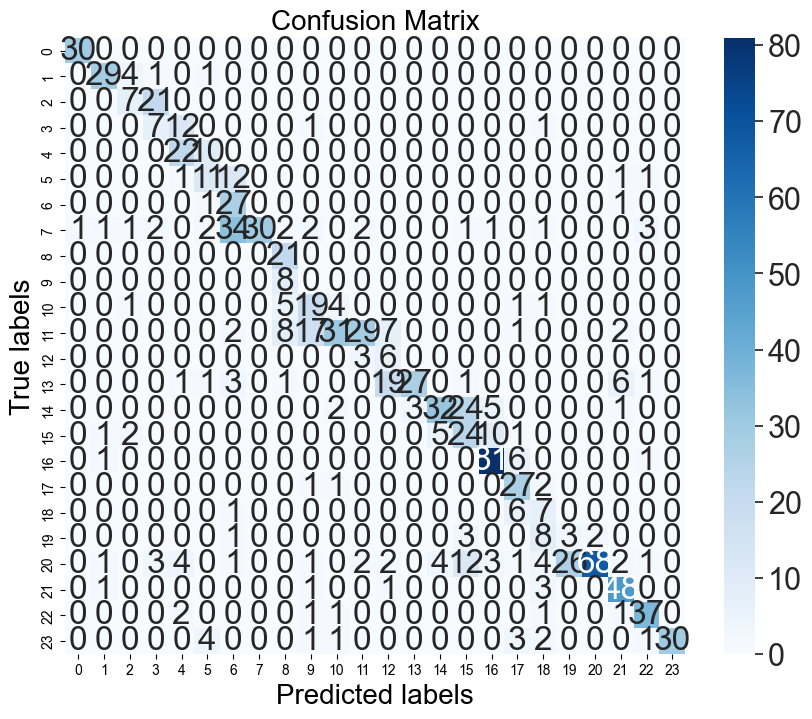

In [30]:
cm = confusion_matrix(y_pred,y_test)

plt.figure(figsize=(10, 8))
ax = plt.subplot()
sns.set(font_scale=2.0)
sns.heatmap(cm, annot=True, fmt='g', cmap="Blues", ax=ax); 

# labels, title and ticks
ax.set_xlabel('Predicted labels', fontsize=20);
ax.set_ylabel('True labels', fontsize=20); 
ax.set_title('Confusion Matrix', fontsize=20); 


In [31]:
f1_score(y_test, y_pred, average='micro')

0.5808612440191387

In [32]:
recall_score(y_test, y_pred, average='weighted')

0.5808612440191387

In [33]:
precision_score(y_test, y_pred, average='micro')

0.5808612440191387

# Saving Model

In [34]:
model.save("Classification_model_vgg19(21).h5")